# Semantic Segmentation with Cambridge Labeled Objects in Video dataset

## Import libraries

In [97]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import os
import random
import re
from PIL import Image


import numpy as np
import matplotlib.pyplot as plt
from pylab import *
import os
import sys
from tensorflow.keras.models import Model
from tensorflow.keras.regularizers import l2
from tensorflow.keras.layers import *


#from tensorflow.keras.engine import Layer
from tensorflow.keras.applications.vgg16 import *
from tensorflow.keras.models import *
#from tensorflow.keras.applications.imagenet_utils import _obtain_input_shape
import tensorflow.keras.backend as K
import tensorflow as tf
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Convolution2D, ZeroPadding2D, MaxPooling2D, Cropping2D, Conv2D
from tensorflow.keras.layers import Input, Add, Dropout, Permute, add
# from tensorflow.compat.v1.layers import conv2d_transpose
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.python.keras.callbacks import TensorBoard, ModelCheckpoint, EarlyStopping, ReduceLROnPlateau

import shutil
import zipfile
from tensorflow.keras.optimizers import Adam, SGD, Adagrad
from tensorflow.keras.losses import CategoricalCrossentropy, BinaryCrossentropy
from tensorflow.keras.metrics import MeanIoU, Accuracy
import time

from tensorflow.keras.models import *
from tensorflow.keras.layers import *

# Environment checks

In [98]:
print(tf.__version__)

2.12.0


In [99]:
x = tf.random.uniform([3, 3])

print("Is there a GPU available: "),
print(tf.test.is_gpu_available())

print("Is the Tensor on GPU #0:  "),
print(x.device.endswith('GPU:0'))

print("Device name: {}".format((x.device)))

Is there a GPU available: 
True
Is the Tensor on GPU #0:  
True
Device name: /job:localhost/replica:0/task:0/device:GPU:0


In [100]:
print(tf.executing_eagerly())

True


In [101]:
# zip_file = 'ASSN_3/c101.zip'

# If using Google colab
zip_file = 'Cam101.zip'
destination_folder = 'datasets/'

# Create the destination folder if it doesn't exist
if not os.path.exists(destination_folder):
    os.makedirs(destination_folder)

# Extract the contents of the zip file to the destination folder
with zipfile.ZipFile(zip_file, 'r') as zip_ref:
    zip_ref.extractall(destination_folder)

## Data preparation - Importing, Cleaning and Creating structured directory 

### Function to import and process frames and masks as tensors

In [102]:
def _read_to_tensor(fname, output_height=224, output_width=224, normalize_data=False):
    '''Function to read images from given image file path, and provide resized images as tensors
        Inputs: 
            fname - image file path
            output_height - required output image height
            output_width - required output image width
            normalize_data - if True, normalize data to be centered around 0 (mean 0, range 0 to 1)
        Output: Processed image tensors
    '''
    
    # Read the image as a tensor
    img_strings = tf.io.read_file(fname)
    imgs_decoded = tf.image.decode_jpeg(img_strings)
    
    # Resize the image
    output = tf.image.resize(imgs_decoded, [output_height, output_width])
    
    # Normalize if required
    if normalize_data:
        output = (output - 128) / 128
    return output

### Image directory and size parameters

In [103]:
img_dir = 'datasets/Cam101/train/'

# Required image dimensions
output_height = 224
output_width = 224

### Reading frames and masks
- Mask file names end in "\_L.png"


In [104]:
def read_images(img_dir):
    '''Function to get all image directories, read images and masks in separate tensors
        Inputs: 
            img_dir - file directory
        Outputs 
            frame_tensors, masks_tensors, frame files list, mask files list
    '''
    
    # Get the file names list from provided directory
    file_list = [f for f in os.listdir(img_dir) if os.path.isfile(os.path.join(img_dir, f))]
    
    # Separate frame and mask files lists, exclude unnecessary files
    frames_list = [file for file in file_list if ('_L' not in file) and ('txt' not in file)]
    masks_list = [file for file in file_list if ('_L' in file) and ('txt' not in file)]
    
    frames_list.sort()
    masks_list.sort()
    
    print('{} frame files found in the provided directory.'.format(len(frames_list)))
    print('{} mask files found in the provided directory.'.format(len(masks_list)))
    
    # Create file paths from file names
    frames_paths = [os.path.join(img_dir, fname) for fname in frames_list]
    masks_paths = [os.path.join(img_dir, fname) for fname in masks_list]
    
    # Create dataset of tensors
    frame_data = tf.data.Dataset.from_tensor_slices(frames_paths)
    masks_data = tf.data.Dataset.from_tensor_slices(masks_paths)
    
    # Read images into the tensor dataset
    frame_tensors = frame_data.map(_read_to_tensor)
    masks_tensors = masks_data.map(_read_to_tensor)
    
    print('Completed importing {} frame images from the provided directory.'.format(len(frames_list)))
    print('Completed importing {} mask images from the provided directory.'.format(len(masks_list)))
    
    return frame_tensors, masks_tensors, frames_list, masks_list

frame_tensors, masks_tensors, frames_list, masks_list = read_images(img_dir)

90 frame files found in the provided directory.
90 mask files found in the provided directory.
Completed importing 90 frame images from the provided directory.
Completed importing 90 mask images from the provided directory.


In [105]:
test_image_dir = 'datasets/Cam101/test/'
frame_tensors_test, masks_tensors_test, frames_list_test, masks_list_test = read_images(test_image_dir)

11 frame files found in the provided directory.
11 mask files found in the provided directory.
Completed importing 11 frame images from the provided directory.
Completed importing 11 mask images from the provided directory.


### Displaying Images in the train dataset

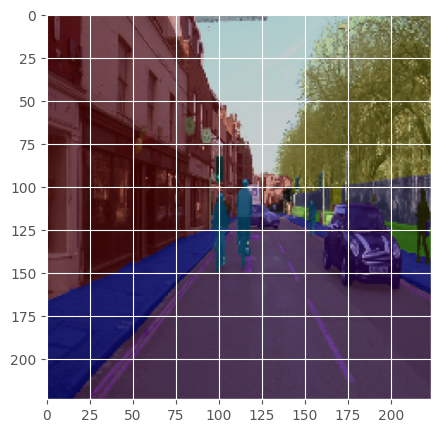

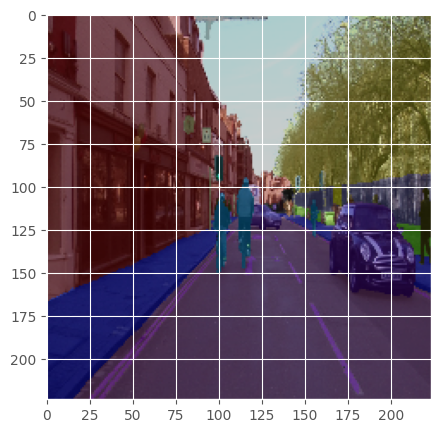

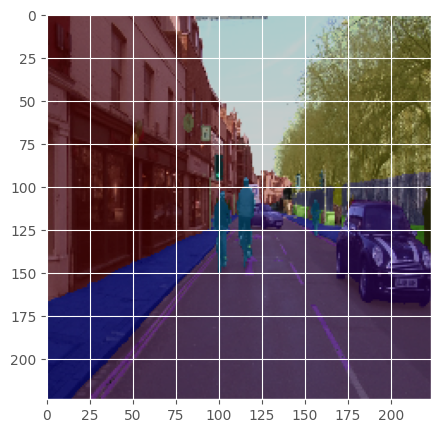

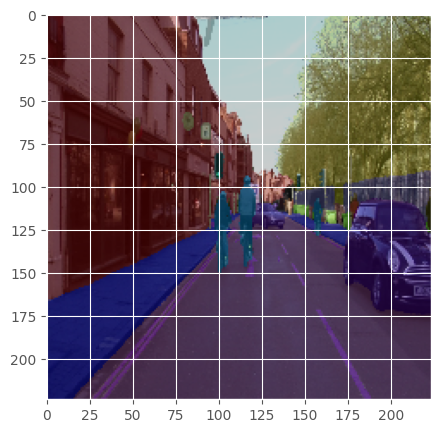

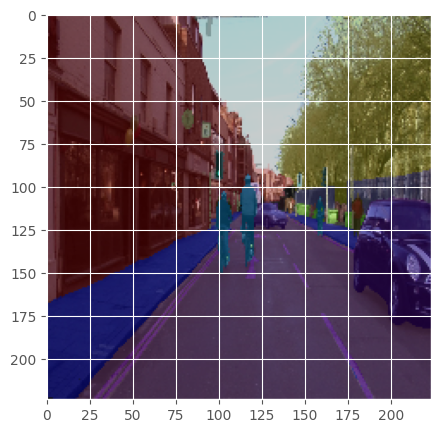

In [106]:
# Make an iterator to extract images from the tensor dataset

frame_batches = iter(frame_tensors)  # outside of TF Eager, we would use
mask_batches = iter(masks_tensors)

n_images_to_show = 5

for i in range(n_images_to_show):
    
    # Get the next image from iterator
    fig,ax = plt.subplots(1,figsize=(5,5))
    frame = frame_batches.next().numpy().astype(np.uint8)
    mask = mask_batches.next().numpy().astype(np.uint8)
    ax.imshow(frame)
    ax.imshow(mask,alpha = 0.4)

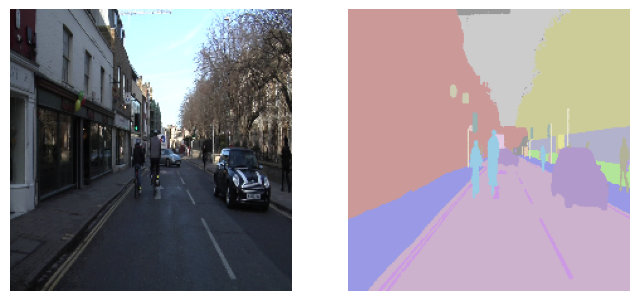

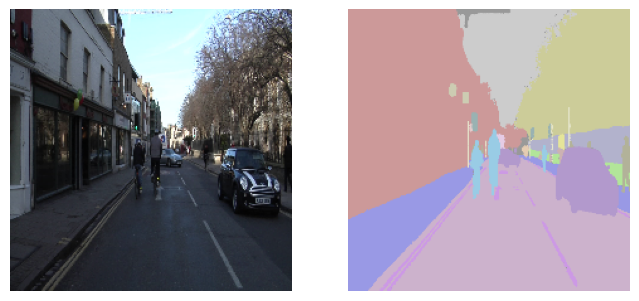

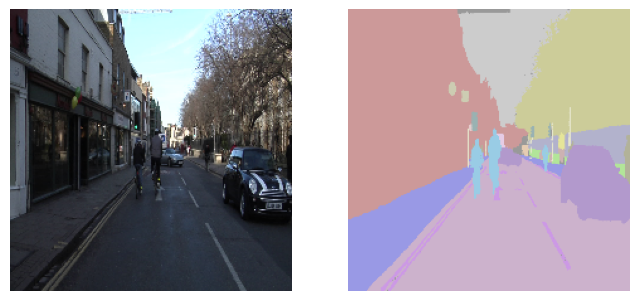

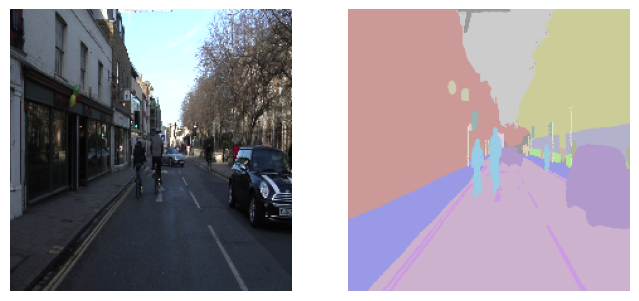

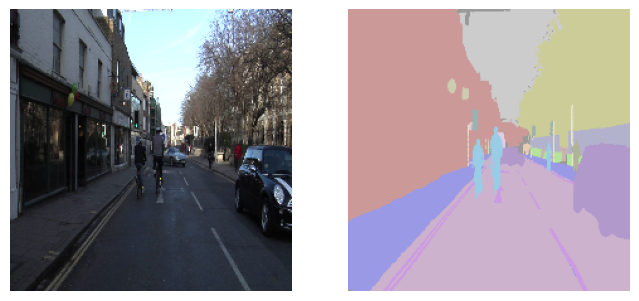

In [107]:
# Make an iterator to extract images from the tensor dataset

frame_batches = iter(frame_tensors)  # outside of TF Eager, we would use
mask_batches = iter(masks_tensors)

n_images_to_show = 5

# fig, axes = plt.subplots(rows, cols, figsize=(5*cols, 5*rows))

for i in range(n_images_to_show):
    
    # Get the next image from iterator
    frame = frame_batches.next().numpy().astype(np.uint8)
    mask = mask_batches.next().numpy().astype(np.uint8)

    fig, axes = plt.subplots(1, 2, figsize=(8, 5))
    ax1, ax2 = axes
    ax1.imshow(frame)
    ax2.imshow(mask, alpha=0.4)
    ax1.axis('off')
    ax2.axis('off')

    plt.show()

### Creating folder structure common for Computer Vision problems

In [108]:
DATA_PATH = 'datasets_train/'

# Create folders to hold images and masks

folders = ['train_frames/train', 'train_masks/train', 'val_frames/val', 'val_masks/val']


for folder in folders:
    try:
        os.makedirs(DATA_PATH + folder)
    except Exception as e: print(e)

In [109]:
DATA_PATH2 = 'datasets_test/'

# Create folders to hold images and masks

folders = ['test_frames/test', 'test_masks/test']


for folder in folders:
    try:
        os.makedirs(DATA_PATH2 + folder)
    except Exception as e: print(e)

### Saving frames and masks to correct directories

In [110]:
def generate_image_folder_structure(frames, masks, frames_list, masks_list):
    '''Function to save images in the appropriate folder directories 
        Inputs: 
            frames - frame tensor dataset
            masks - mask tensor dataset
            frames_list - frame file paths
            masks_list - mask file paths
    '''
    #Create iterators for frames and masks
    frame_batches = iter(frames)  # outside of TF Eager, we would use make_one_shot_iterator
    mask_batches = iter(masks)
    
    #Iterate over the train images while saving the frames and masks in appropriate folders
    dir_name='train'
    for file in zip(frames_list[:-round(0.1*len(frames_list))],masks_list[:-round(0.1*len(masks_list))]):
        
        
        #Convert tensors to numpy arrays
        frame = frame_batches.next().numpy().astype(np.uint8)
        mask = mask_batches.next().numpy().astype(np.uint8)
        
        #Convert numpy arrays to images
        frame = Image.fromarray(frame)
        mask = Image.fromarray(mask)
        
        #Save frames and masks to correct directories
        frame.save(DATA_PATH+'{}_frames/{}'.format(dir_name,dir_name)+'/'+file[0])
        mask.save(DATA_PATH+'{}_masks/{}'.format(dir_name,dir_name)+'/'+file[1])
    
    #Iterate over the val images while saving the frames and masks in appropriate folders
    dir_name='val'
    for file in zip(frames_list[-round(0.1*len(frames_list)):],masks_list[-round(0.1*len(masks_list)):]):
        
        
        #Convert tensors to numpy arrays
        frame = frame_batches.next().numpy().astype(np.uint8)
        mask = mask_batches.next().numpy().astype(np.uint8)
        
        #Convert numpy arrays to images
        frame = Image.fromarray(frame)
        mask = Image.fromarray(mask)
        
        #Save frames and masks to correct directories
        frame.save(DATA_PATH+'{}_frames/{}'.format(dir_name,dir_name)+'/'+file[0])
        mask.save(DATA_PATH+'{}_masks/{}'.format(dir_name,dir_name)+'/'+file[1])
    
    print("Saved {} frames to directory {}".format(len(frames_list),DATA_PATH))
    print("Saved {} masks to directory {}".format(len(masks_list),DATA_PATH))
    
generate_image_folder_structure(frame_tensors, masks_tensors, frames_list, masks_list)

#generate_image_folder_structure(train_frames, train_masks, val_files, 'val')

Saved 90 frames to directory datasets_train/
Saved 90 masks to directory datasets_train/


In [111]:
def generate_image_folder_structure_test(frames, masks, frames_list, masks_list):
    '''Function to save images in the appropriate folder directories 
        Inputs: 
            frames - frame tensor dataset
            masks - mask tensor dataset
            frames_list - frame file paths
            masks_list - mask file paths
    '''
    DATA_PATH = "datasets_test/"
    #Create iterators for frames and masks
    frame_batches = iter(frames)  # outside of TF Eager, we would use make_one_shot_iterator
    mask_batches = iter(masks)
    
    #Iterate over the train images while saving the frames and masks in appropriate folders
    dir_name='test'
    for file in zip(frames_list[:],masks_list[:]):
        
        
        #Convert tensors to numpy arrays
        frame = frame_batches.next().numpy().astype(np.uint8)
        mask = mask_batches.next().numpy().astype(np.uint8)
        
        #Convert numpy arrays to images
        frame = Image.fromarray(frame)
        mask = Image.fromarray(mask)
        
        #Save frames and masks to correct directories
        frame.save(DATA_PATH+'{}_frames/{}'.format(dir_name,dir_name)+'/'+file[0])
        mask.save(DATA_PATH+'{}_masks/{}'.format(dir_name,dir_name)+'/'+file[1])
    
    print("Saved {} frames to directory {}".format(len(frames_list),DATA_PATH))
    print("Saved {} masks to directory {}".format(len(masks_list),DATA_PATH))

In [112]:
generate_image_folder_structure_test(frame_tensors_test, masks_tensors_test, frames_list_test, masks_list_test)

Saved 11 frames to directory datasets_test/
Saved 11 masks to directory datasets_test/


## Extract Target Class definitions

### Function to parse the file "label_colors.txt" which contains the class definitions

In [113]:
def parse_code(l):
    '''Function to parse lines in a text file, returns separated elements (label codes and names in this case)
    '''
    if len(l.strip().split("\t")) == 2:
        a, b = l.strip().split("\t")
        return tuple(int(i) for i in a.split(' ')), b
    else:
        a, b, c = l.strip().split("\t")
        return tuple(int(i) for i in a.split(' ')), c

### Parse and extract label names and codes

In [114]:
label_codes, label_names = zip(*[parse_code(l) for l in open("datasets/Cam101/label_colors.txt")])
label_codes, label_names = list(label_codes), list(label_names)
label_codes[:5], label_names[:5]

([(64, 128, 64), (192, 0, 128), (0, 128, 192), (0, 128, 64), (128, 0, 0)],
 ['Animal', 'Archway', 'Bicyclist', 'Bridge', 'Building'])

### Create useful label and code conversion dictionaries
_These will be used for:_
- One hot encoding the mask labels for model training
- Decoding the predicted labels for interpretation and visualization

In [115]:
code2id = {v:k for k,v in enumerate(label_codes)}
id2code = {k:v for k,v in enumerate(label_codes)}

In [116]:
name2id = {v:k for k,v in enumerate(label_names)}
id2name = {k:v for k,v in enumerate(label_names)}

In [117]:
# id2code
list(id2code.items())[:5]

[(0, (64, 128, 64)),
 (1, (192, 0, 128)),
 (2, (0, 128, 192)),
 (3, (0, 128, 64)),
 (4, (128, 0, 0))]

In [118]:
# id2name
list(id2name.items())[:5]

[(0, 'Animal'),
 (1, 'Archway'),
 (2, 'Bicyclist'),
 (3, 'Bridge'),
 (4, 'Building')]

### Define functions for one hot encoding rgb labels, and decoding encoded predictions

In [119]:
def rgb_to_onehot(rgb_image, colormap = id2code):
    '''Function to one hot encode RGB mask labels
        Inputs: 
            rgb_image - image matrix (eg. 256 x 256 x 3 dimension numpy ndarray)
            colormap - dictionary of color to label id
        Output: One hot encoded image of dimensions (height x width x num_classes) where num_classes = len(colormap)
    '''
    num_classes = len(colormap)
    shape = rgb_image.shape[:2]+(num_classes,)
    encoded_image = np.zeros( shape, dtype=np.int8 )
    for i, cls in enumerate(colormap):
        encoded_image[:,:,i] = np.all(rgb_image.reshape( (-1,3) ) == colormap[i], axis=1).reshape(shape[:2])
    return encoded_image


def onehot_to_rgb(onehot, colormap = id2code):
    '''Function to decode encoded mask labels
        Inputs: 
            onehot - one hot encoded image matrix (height x width x num_classes)
            colormap - dictionary of color to label id
        Output: Decoded RGB image (height x width x 3) 
    '''
    single_layer = np.argmax(onehot, axis=-1)
    output = np.zeros( onehot.shape[:2]+(3,) )
    for k in colormap.keys():
        output[single_layer==k] = colormap[k]
    return np.uint8(output)

# Creating custom Image data generators

### Defining data generators

In [120]:
# Normalizing only frame images, since masks contain label info
# Also doing Data augmentaion
data_gen_args = dict(rescale=1./255,
                     rotation_range=15,
                     zoom_range=0.2,
                     horizontal_flip=True)
mask_gen_args = dict()

train_frames_datagen = ImageDataGenerator(**data_gen_args)
train_masks_datagen = ImageDataGenerator(**mask_gen_args)
val_frames_datagen = ImageDataGenerator(**data_gen_args)
val_masks_datagen = ImageDataGenerator(**mask_gen_args)

# Seed defined for aligning images and their masks
seed = 1

### Custom image data generators for creating batches of frames and masks

In [121]:
def TrainAugmentGenerator(seed = 1, batch_size = 5):
    '''Train Image data generator
        Inputs: 
            seed - seed provided to the flow_from_directory function to ensure aligned data flow
            batch_size - number of images to import at a time
        Output: Decoded RGB image (height x width x 3) 
    '''
    train_image_generator = train_frames_datagen.flow_from_directory(
    DATA_PATH + 'train_frames/',
    batch_size = batch_size, seed = seed, target_size = (224, 224))

    train_mask_generator = train_masks_datagen.flow_from_directory(
    DATA_PATH + 'train_masks/',
    batch_size = batch_size, seed = seed, target_size = (224, 224))

    while True:
        X1i = train_image_generator.next()
        X2i = train_mask_generator.next()
        
        #One hot encoding RGB images
        mask_encoded = [rgb_to_onehot(X2i[0][x,:,:,:], id2code) for x in range(X2i[0].shape[0])]
        
        yield X1i[0], np.asarray(mask_encoded)

def ValAugmentGenerator(seed = 1, batch_size = 5):
    '''Validation Image data generator
        Inputs: 
            seed - seed provided to the flow_from_directory function to ensure aligned data flow
            batch_size - number of images to import at a time
        Output: Decoded RGB image (height x width x 3) 
    '''
    val_image_generator = val_frames_datagen.flow_from_directory(
    DATA_PATH + 'val_frames/',
    batch_size = batch_size, seed = seed, target_size = (224, 224))


    val_mask_generator = val_masks_datagen.flow_from_directory(
    DATA_PATH + 'val_masks/',
    batch_size = batch_size, seed = seed, target_size = (224, 224))


    while True:
        X1i = val_image_generator.next()
        X2i = val_mask_generator.next()
        
        #One hot encoding RGB images
        mask_encoded = [rgb_to_onehot(X2i[0][x,:,:,:], id2code) for x in range(X2i[0].shape[0])]
        
        yield X1i[0], np.asarray(mask_encoded)
        


In [122]:
def TestAugmentGenerator2(seed=1, batch_size=5):
    test_image_generator = val_frames_datagen.flow_from_directory(
        DATA_PATH2 + 'test_frames/',
        batch_size=batch_size, seed=seed, target_size=(224, 224))

    test_mask_generator = val_masks_datagen.flow_from_directory(
        DATA_PATH2 + 'test_masks/',
        batch_size=batch_size, seed=seed, target_size=(224, 224))

    num_batches = len(test_image_generator)
    for _ in range(num_batches):
        X1i = test_image_generator.next()
        X2i = test_mask_generator.next()

        mask_encoded = [rgb_to_onehot(X2i[0][x, :, :, :], id2code) for x in range(X2i[0].shape[0])]

        yield X1i[0], np.asarray(mask_encoded)


# Defining FCN-32 model for semantic segmentation
<b>FCN-32 Architecture</b>


In [123]:
os.getcwd()

'/content'

In [124]:
os.getcwd()
!mkdir pretrained_weights

### Function to create FCN-32 model, using VGG-16 pre-trained weights

In [125]:
import urllib.request

VGG_Weights_path = "/content/pretrained_weights/vgg16_weights_tf_dim_ordering_tf_kernels.h5"

# Download the VGG16 weights file
url = "https://github.com/fchollet/deep-learning-models/releases/download/v0.1/vgg16_weights_tf_dim_ordering_tf_kernels.h5"
urllib.request.urlretrieve(url, VGG_Weights_path)

('/content/pretrained_weights/vgg16_weights_tf_dim_ordering_tf_kernels.h5',
 <http.client.HTTPMessage at 0x7f06b146f700>)

In [126]:
# VGG_Weights_path = "pretrained_weights/vgg16_weights_tf_dim_ordering_tf_kernels.h5"

IMAGE_ORDERING = 'channels_last'


def FCN32( n_classes ,  input_height=224, input_width=224 , vgg_level=3):

    assert input_height%32 == 0
    assert input_width%32 == 0

    
    img_input = Input(shape=(input_height,input_width,3))

    x = Conv2D(64, (3, 3), activation='relu', padding='same', name='block1_conv1', data_format=IMAGE_ORDERING )(img_input)
    x = Conv2D(64, (3, 3), activation='relu', padding='same', name='block1_conv2', data_format=IMAGE_ORDERING )(x)
    x = MaxPooling2D((2, 2), strides=(2, 2), name='block1_pool', data_format=IMAGE_ORDERING )(x)
    f1 = x
    # Block 2
    x = Conv2D(128, (3, 3), activation='relu', padding='same', name='block2_conv1', data_format=IMAGE_ORDERING )(x)
    x = Conv2D(128, (3, 3), activation='relu', padding='same', name='block2_conv2', data_format=IMAGE_ORDERING )(x)
    x = MaxPooling2D((2, 2), strides=(2, 2), name='block2_pool', data_format=IMAGE_ORDERING )(x)
    f2 = x

    # Block 3
    x = Conv2D(256, (3, 3), activation='relu', padding='same', name='block3_conv1', data_format=IMAGE_ORDERING )(x)
    x = Conv2D(256, (3, 3), activation='relu', padding='same', name='block3_conv2', data_format=IMAGE_ORDERING )(x)
    x = Conv2D(256, (3, 3), activation='relu', padding='same', name='block3_conv3', data_format=IMAGE_ORDERING )(x)
    x = MaxPooling2D((2, 2), strides=(2, 2), name='block3_pool', data_format=IMAGE_ORDERING )(x)
    f3 = x

    # Block 4
    x = Conv2D(512, (3, 3), activation='relu', padding='same', name='block4_conv1', data_format=IMAGE_ORDERING )(x)
    x = Conv2D(512, (3, 3), activation='relu', padding='same', name='block4_conv2', data_format=IMAGE_ORDERING )(x)
    x = Conv2D(512, (3, 3), activation='relu', padding='same', name='block4_conv3', data_format=IMAGE_ORDERING )(x)
    x = MaxPooling2D((2, 2), strides=(2, 2), name='block4_pool', data_format=IMAGE_ORDERING )(x)
    f4 = x

    # Block 5
    x = Conv2D(512, (3, 3), activation='relu', padding='same', name='block5_conv1', data_format=IMAGE_ORDERING )(x)
    x = Conv2D(512, (3, 3), activation='relu', padding='same', name='block5_conv2', data_format=IMAGE_ORDERING )(x)
    x = Conv2D(512, (3, 3), activation='relu', padding='same', name='block5_conv3', data_format=IMAGE_ORDERING )(x)
    x = MaxPooling2D((2, 2), strides=(2, 2), name='block5_pool', data_format=IMAGE_ORDERING )(x)
    f5 = x

    x = Flatten(name='flatten')(x)
    x = Dense(4096, activation='relu', name='fc1')(x)
    x = Dense(4096, activation='relu', name='fc2')(x)
    x = Dense( 1000 , activation='softmax', name='predictions')(x)

    vgg  = Model(  img_input , x  )
    vgg.load_weights(VGG_Weights_path)

    o = f5

    o = ( Conv2D( 4096 , ( 7 , 7 ) , activation='relu' , padding='same', data_format=IMAGE_ORDERING))(o)
    o = Dropout(0.5)(o)
    o = ( Conv2D( 4096 , ( 1 , 1 ) , activation='relu' , padding='same', data_format=IMAGE_ORDERING))(o)
    o = Dropout(0.5)(o)

    o = ( Conv2D( n_classes ,  ( 1 , 1 ) ,kernel_initializer='he_normal' , data_format=IMAGE_ORDERING))(o)
    o = Conv2DTranspose( n_classes , kernel_size=(32,32) ,  strides=(32,32) , use_bias=False ,  data_format=IMAGE_ORDERING )(o)
    #o_shape = Model(img_input , o ).output_shape

    #outputHeight = o_shape[2]
    #outputWidth = o_shape[3]

    #print ("koko" , o_shape)

    #o = (Reshape(( -1  , outputHeight*outputWidth   )))(o)
    #o = (Permute((2, 1)))(o)
    o = (Activation('softmax'))(o)
    model = Model( img_input , o )
    #model.outputWidth = outputWidth
    #model.outputHeight = outputHeight
    
    #only 10 last layer that trainable 
    for layer in model.layers[:len(model.layers)-10]:
        layer.trainable = False

    return model


In [127]:
model = FCN32( 32 ,  input_height=224, input_width=224 , vgg_level=3)


In [128]:
model.summary()

Model: "model_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_5 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0   

## Compiling model

In [129]:
#model.load_weights("model_100_epochs.h5")

## Define model callback settings

In [130]:
# tb = TensorBoard(log_dir='logs', write_graph=True)
mc = ModelCheckpoint(mode='max', filepath='model_FCN32_checkpoint.h5', monitor='accuracy', save_best_only='True', save_weights_only='True', verbose=1)
es = EarlyStopping(mode='max', monitor='val_accuracy', patience=10, verbose=1)
callbacks = [mc, es]
# callbacks = [tb, mc, es]

## Train and save the FCN model

In [131]:
def dice_coef(y_true, y_pred):
    """Computes the Dice coefficient between two tensors.
    
    Args:
    y_true: A tensor of ground truth values.
    y_pred: A tensor of predicted values.
    
    Returns:
    A tensor of the Dice coefficient.
    """
    smooth = 1.
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (K.sum(y_true_f*y_true_f) + K.sum(y_pred_f*y_pred_f) + smooth)

In [132]:
def dice_coef_loss2(y_true, y_pred):
    smooth = 1e-5  # A small value to avoid division by zero
    y_true = tf.cast(y_true, tf.float32)
    y_pred = tf.cast(y_pred, tf.float32)
    intersection = tf.reduce_sum(y_true * y_pred)
    union = tf.reduce_sum(y_true) + tf.reduce_sum(y_pred)
    dice_coef = (2.0 * intersection + smooth) / (union + smooth)
    loss = 1.0 - dice_coef
    return loss

In [133]:
batch_size = 5
steps_per_epoch = np.ceil(float(len(frames_list) - round(0.2*len(frames_list))) / float(batch_size))
steps_per_epoch

15.0

In [134]:
validation_steps = (float((round(0.2*len(frames_list)))) / float(batch_size))
validation_steps 

3.6

In [135]:
num_epochs = 50

In [136]:
loss_functions = ["categorical_crossentropy", dice_coef_loss2]

In [137]:
class TimingCallback(tf.keras.callbacks.Callback):
    def on_train_begin(self, logs={}):
        self.train_times = []
        
    def on_epoch_begin(self, epoch, logs={}):
        self.start_time = time.time()
        
    def on_epoch_end(self, epoch, logs={}):
        epoch_time = time.time() - self.start_time
        self.train_times.append(epoch_time)
        logs['time'] = epoch_time

In [138]:
best_model = None
best_score = 0

lr = 0.001
optimizer = Adam(learning_rate=lr)
loss_functions = [dice_coef_loss2, "categorical_crossentropy"]
metrics = [MeanIoU(32), dice_coef, 'accuracy']

model = FCN32(32 , input_height=224, input_width=224, vgg_level=3)


for loss_function in loss_functions:
    model.compile(optimizer=optimizer, loss=loss_function, metrics=metrics)

    # Create an instance of the TimingCallback class
    timing_callback = TimingCallback()

    # Train the model with the timing callback
    result = model.fit(TrainAugmentGenerator(), steps_per_epoch=steps_per_epoch,
                          validation_data=ValAugmentGenerator(),
                          validation_steps=validation_steps, epochs=num_epochs,
                          callbacks=[callbacks, timing_callback], use_multiprocessing=False, verbose=2)
    model.save_weights("model_FCN32.h5", overwrite=True)

    # Get the training time for each epoch from the train_times attribute of the timing_callback object
    training_time = np.sum(timing_callback.train_times)

    # Print the total training time
    print("Total training time: {} seconds".format(training_time))

    score = model.evaluate(x=ValAugmentGenerator(), steps=100, verbose=1)

# Making pixel-wise accuracy as the main deciding metric
    if score[3] > best_score:
        best_model = model
        best_score = score[3]
        best_hyperparameters = {
                      'learning_rate': lr,
                      'optimizer': optimizer,
                      'loss_function': str(loss_function),
                      'total_time': training_time
                    }
      
        model.save_weights("model_FCN32_lr{}_{}_{}.h5".format(lr, optimizer.__class__.__name__,
                                                                    loss_function.__class__.__name__), overwrite=True)
    

print("Best hyperparameters:", best_hyperparameters)
print("Total time:", {training_time})

Found 81 images belonging to 1 classes.
Found 81 images belonging to 1 classes.
Epoch 1/50
Found 9 images belonging to 1 classes.
Found 9 images belonging to 1 classes.

Epoch 00001: accuracy improved from -inf to 0.22622, saving model to model_FCN32_checkpoint.h5
15/15 - 23s - loss: 0.7871 - mean_io_u_9: 0.5456 - dice_coef: 0.2271 - accuracy: 0.2262 - val_loss: 0.5411 - val_mean_io_u_9: 0.6322 - val_dice_coef: 0.4592 - val_accuracy: 0.4532 - time: 22.8748 - 23s/epoch - 2s/step
Epoch 2/50

Epoch 00002: accuracy improved from 0.22622 to 0.54338, saving model to model_FCN32_checkpoint.h5
15/15 - 27s - loss: 0.4488 - mean_io_u_9: 0.6765 - dice_coef: 0.5482 - accuracy: 0.5434 - val_loss: 0.4061 - val_mean_io_u_9: 0.6985 - val_dice_coef: 0.5940 - val_accuracy: 0.5865 - time: 26.7130 - 27s/epoch - 2s/step
Epoch 3/50

Epoch 00003: accuracy improved from 0.54338 to 0.56923, saving model to model_FCN32_checkpoint.h5
15/15 - 20s - loss: 0.4226 - mean_io_u_9: 0.6898 - dice_coef: 0.5763 - accuracy

# FCN32 Model Evaluation

### Model evaluation historical plots

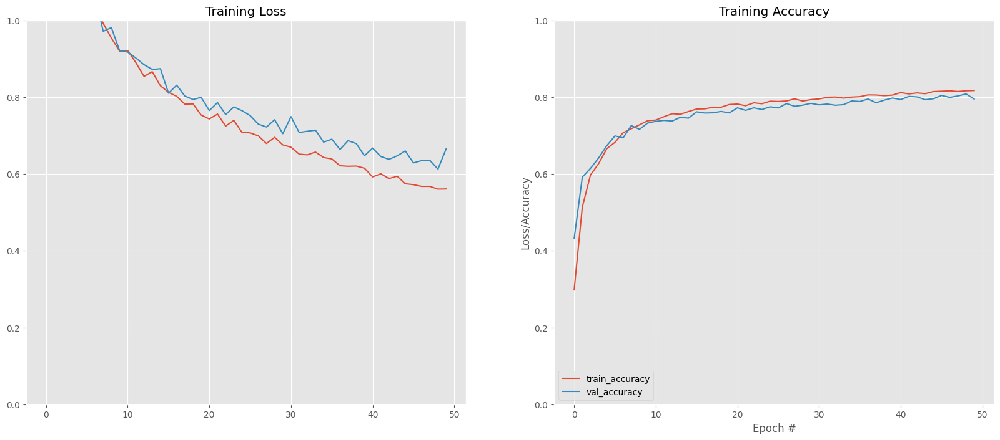

In [139]:
# Get actual number of epochs model was trained for
N = len(result.history['loss'])

#Plot the model evaluation history
plt.style.use("ggplot")
fig = plt.figure(figsize=(20,8))

fig.add_subplot(1,2,1)
plt.title("Training Loss")
plt.plot(np.arange(0, N), result.history["loss"], label="train_loss")
plt.plot(np.arange(0, N), result.history["val_loss"], label="val_loss")
plt.ylim(0, 1)

fig.add_subplot(1,2,2)
plt.title("Training Accuracy")
plt.plot(np.arange(0, N), result.history["accuracy"], label="train_accuracy")
plt.plot(np.arange(0, N), result.history["val_accuracy"], label="val_accuracy")
plt.ylim(0, 1)

plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend(loc="lower left")
plt.show()

### Extract and display model frame, prediction and mask batch

In [140]:
testing_gen = TestAugmentGenerator2()
batch_img, batch_mask = next(testing_gen)
pred_all = model.predict(batch_img)
np.shape(pred_all)

# Evaluate the model on the testing data
evaluation_result = model.evaluate(testing_gen, steps=100)

# Unpack the evaluation results
test_loss, test_accuracy = evaluation_result[0], evaluation_result[1]

# Print the results
print("FCN Test Loss:", test_loss)
print("FCN Test Accuracy:", test_accuracy)

Found 11 images belonging to 1 classes.
Found 11 images belonging to 1 classes.
  2/100 [..............................] - ETA: 7s - loss: 0.6127 - mean_io_u_9: 0.4855 - dice_coef: 0.8499 - accuracy: 0.8027 

100/100 [==============================] - 0s 1ms/step - loss: 0.6127 - mean_io_u_9: 0.4855 - dice_coef: 0.8499 - accuracy: 0.8027
FCN Test Loss: 0.6127285361289978
FCN Test Accuracy: 0.48551085591316223


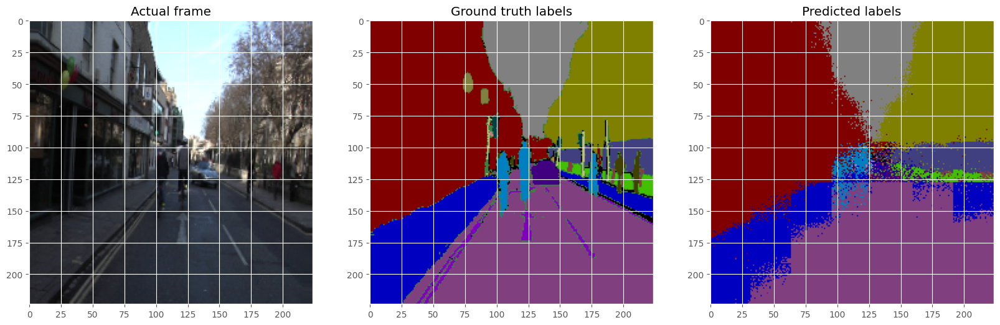

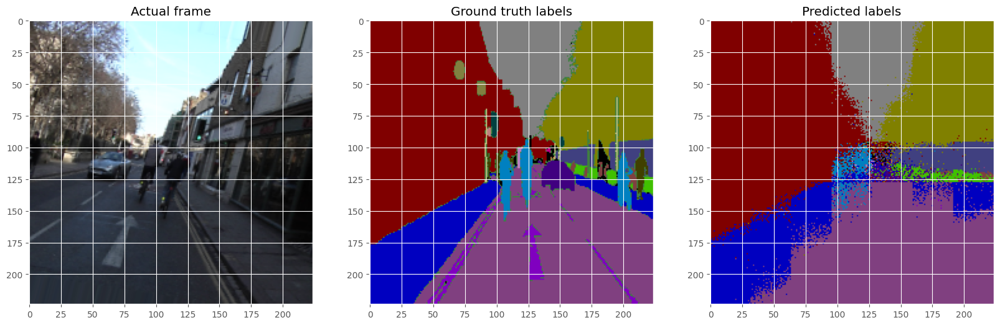

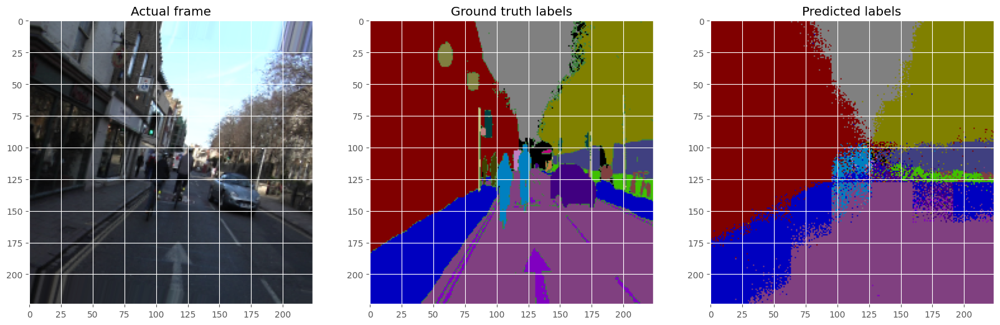

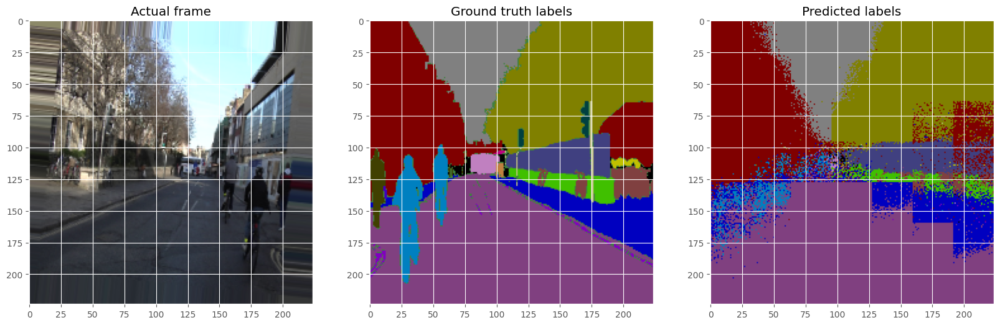

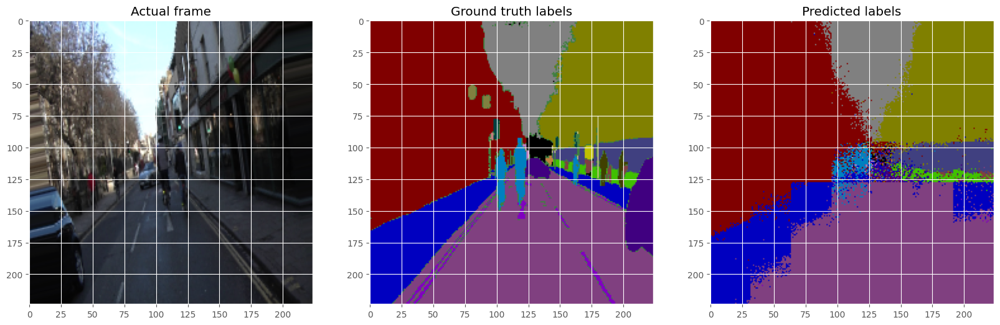

In [141]:
for i in range(0,np.shape(pred_all)[0]):
    
    fig = plt.figure(figsize=(20,8))
    
    ax1 = fig.add_subplot(1,3,1)
    ax1.imshow(batch_img[i])
    ax1.title.set_text('Actual frame')
#     ax1.grid(b=None)
    
    
    ax2 = fig.add_subplot(1,3,2)
    ax2.set_title('Ground truth labels')
    ax2.imshow(onehot_to_rgb(batch_mask[i],id2code))
#     ax2.grid(b=None)
    
    ax3 = fig.add_subplot(1,3,3)
    ax3.set_title('Predicted labels')
    ax3.imshow(onehot_to_rgb(pred_all[i],id2code))
#     ax3.grid(b=None)
    
    plt.show()

Defining DeepLab_v3 model for semantic segmentation

In [142]:
# Create generators
train_generator = TrainAugmentGenerator(batch_size=batch_size)
val_generator = ValAugmentGenerator(batch_size=batch_size)

# Generate a batch of data
train_images, train_masks = next(train_generator)
val_images, val_masks = next(val_generator)

# Print shapes
print(train_images.shape)  # should be (5, 224, 224, 3)
print(train_masks.shape)   # should be (5, 224, 224, num_classes)
print(val_images.shape)    # should be (5, 224, 224, 3)
print(val_masks.shape)

Found 81 images belonging to 1 classes.
Found 81 images belonging to 1 classes.
Found 9 images belonging to 1 classes.
Found 9 images belonging to 1 classes.
(5, 224, 224, 3)
(5, 224, 224, 32)
(5, 224, 224, 3)
(5, 224, 224, 32)


In [143]:
def initial_block(inp):
    inp1 = inp
    conv = Conv2D(filters=13, kernel_size=3, strides=2,
                  padding='same', kernel_initializer='he_normal')(inp)
    pool = MaxPool2D(2)(inp1)
    concat = concatenate([conv, pool])
    return concat


def encoder_bottleneck(inp, filters, name, dilation_rate=2, downsample=False, dilated=False, asymmetric=False, drop_rate=0.1):
    reduce = filters // 4
    down = inp
    kernel_stride = 1

    # Downsample
    if downsample:
        kernel_stride = 2
        pad_activations = filters - inp.shape.as_list()[-1]
        down = MaxPool2D(2)(down)
        down = Permute(dims=(1, 3, 2))(down)
        down = ZeroPadding2D(padding=((0, 0), (0, pad_activations)))(down)
        down = Permute(dims=(1, 3, 2))(down)

    # 1*1 Reduce
    x = Conv2D(filters=reduce, kernel_size=kernel_stride, strides=kernel_stride, padding='same',
               use_bias=False, kernel_initializer='he_normal', name=f'{name}_reduce')(inp)
    x = BatchNormalization(momentum=0.1)(x)
    x = PReLU(shared_axes=[1, 2])(x)

    # Conv
    if not dilated and not asymmetric:
        x = Conv2D(filters=reduce, kernel_size=3, padding='same',
                   kernel_initializer='he_normal', name=f'{name}_conv_reg')(x)
    elif dilated:
        x = Conv2D(filters=reduce, kernel_size=3, padding='same', dilation_rate=dilation_rate,
                   kernel_initializer='he_normal', name=f'{name}_reduce_dilated')(x)
    elif asymmetric:
        x = Conv2D(filters=reduce, kernel_size=(1, 5), padding='same', use_bias=False,
                   kernel_initializer='he_normal', name=f'{name}_asymmetric')(x)
        x = Conv2D(filters=reduce, kernel_size=(5, 1), padding='same',
                   kernel_initializer='he_normal', name=name)(x)
    x = BatchNormalization(momentum=0.1)(x)
    x = PReLU(shared_axes=[1, 2])(x)

    # 1*1 Expand
    x = Conv2D(filters=filters, kernel_size=1, padding='same', use_bias=False,
               kernel_initializer='he_normal', name=f'{name}_expand')(x)
    x = BatchNormalization(momentum=0.1)(x)
    x = SpatialDropout2D(rate=drop_rate)(x)

    concat = Add()([x, down])
    concat = PReLU(shared_axes=[1, 2])(concat)
    return concat


def decoder_bottleneck(inp, filters, name, upsample=False):
    reduce = filters // 4
    up = inp

    # Upsample
    if upsample:
        up = Conv2D(filters=filters, kernel_size=1, strides=1, padding='same',
                    use_bias=False, kernel_initializer='he_normal', name=f'{name}_upsample')(up)
        up = UpSampling2D(size=2)(up)

    # 1*1 Reduce
    x = Conv2D(filters=reduce, kernel_size=1, strides=1, padding='same',
               use_bias=False, kernel_initializer='he_normal', name=f'{name}_reduce')(inp)
    x = BatchNormalization(momentum=0.1)(x)
    x = PReLU(shared_axes=[1, 2])(x)

    # Conv
    if not upsample:
        x = Conv2D(filters=reduce, kernel_size=3, strides=1, padding='same',
                   kernel_initializer='he_normal', name=f'{name}_conv_reg')(x)
    else:
        x = Conv2DTranspose(filters=reduce, kernel_size=3, strides=2, padding='same',
                            kernel_initializer='he_normal', name=f'{name}_transpose')(x)
    x = BatchNormalization(momentum=0.1)(x)
    x = PReLU(shared_axes=[1, 2])(x)

    # 1*1 Expand
    x = Conv2D(filters=filters, kernel_size=1, strides=1, padding='same',
               use_bias=False, kernel_initializer='he_normal', name=f'{name}_expand')(x)
    x = BatchNormalization(momentum=0.1)(x)

    concat = Add()([x, up])
    concat = ReLU()(concat)

    return concat

In [144]:
def ENet(H=224, W=224, nclasses=32): # H=384, W=384
    '''
    '''

    print('Loading ENet')
    inp = Input(shape=(H, W, 3))
    enc = initial_block(inp)

    # Bottleneck 1.0
    enc = encoder_bottleneck(enc, 64, name='enc1',
                             downsample=True, drop_rate=0.001)

    enc = encoder_bottleneck(enc, 64, name='enc1.1', drop_rate=0.001)
    enc = encoder_bottleneck(enc, 64, name='enc1.2', drop_rate=0.001)
    enc = encoder_bottleneck(enc, 64, name='enc1.3', drop_rate=0.001)
    enc = encoder_bottleneck(enc, 64, name='enc1.4', drop_rate=0.001)
    
    enc = encoder_bottleneck(enc, 64, name='enc1.5', drop_rate=0.001)
    enc = encoder_bottleneck(enc, 64, name='enc1.6', drop_rate=0.001)
    enc = encoder_bottleneck(enc, 64, name='enc1.7', drop_rate=0.001)

    # Bottleneck 2.0
    enc = encoder_bottleneck(enc, 128, name='enc2.0', downsample=True)
    enc = encoder_bottleneck(enc, 128, name='enc2.1')
    enc = encoder_bottleneck(enc, 128, name='enc2.2',
                             dilation_rate=2, dilated=True)
    enc = encoder_bottleneck(enc, 128, name='enc2.3', asymmetric=True)
    enc = encoder_bottleneck(enc, 128, name='enc2.4',
                             dilation_rate=4, dilated=True)
    enc = encoder_bottleneck(enc, 128, name='enc2.5', asymmetric=True)
    enc = encoder_bottleneck(enc, 128, name='enc2.6',
                             dilation_rate=6, dilated=True)
    enc = encoder_bottleneck(enc, 128, name='enc2.7', asymmetric=True)
    enc = encoder_bottleneck(enc, 128, name='enc2.8',
                             dilation_rate=8, dilated=True)
    
    enc = encoder_bottleneck(enc, 128, name='enc2.9')
    enc = encoder_bottleneck(enc, 128, name='enc2.10',
                             dilation_rate=10, dilated=True)
    enc = encoder_bottleneck(enc, 128, name='enc2.11', asymmetric=True)
    enc = encoder_bottleneck(enc, 128, name='enc2.12',
                             dilation_rate=12, dilated=True)
    enc = encoder_bottleneck(enc, 128, name='enc2.13', asymmetric=True)
    enc = encoder_bottleneck(enc, 128, name='enc2.14',
                             dilation_rate=14, dilated=True)
    enc = encoder_bottleneck(enc, 128, name='enc2.15', asymmetric=True)
    enc = encoder_bottleneck(enc, 128, name='enc2.16',
                             dilation_rate=16, dilated=True)

    # Bottleneck 3.0
    enc = encoder_bottleneck(enc, 128, name='enc3.0')
    enc = encoder_bottleneck(enc, 128, name='enc3.1',
                             dilation_rate=2, dilated=True)
    enc = encoder_bottleneck(enc, 128, name='enc3.2', asymmetric=True)
    enc = encoder_bottleneck(enc, 128, name='enc3.3',
                             dilation_rate=4, dilated=True)
    enc = encoder_bottleneck(enc, 128, name='enc3.4')
    enc = encoder_bottleneck(enc, 128, name='enc3.5',
                             dilation_rate=6, dilated=True)
    enc = encoder_bottleneck(enc, 128, name='enc3.6')
    enc = encoder_bottleneck(enc, 128, name='enc3.7',
                             dilation_rate=8, dilated=True)
    enc = encoder_bottleneck(enc, 128, name='enc3.8', asymmetric=True)
    enc = encoder_bottleneck(enc, 128, name='enc3.9',
                             dilation_rate=10, dilated=True)
    enc = encoder_bottleneck(enc, 128, name='enc3.10', asymmetric=True)
    enc = encoder_bottleneck(enc, 128, name='enc3.11',
                             dilation_rate=12, dilated=True)
    enc = encoder_bottleneck(enc, 128, name='enc3.12', asymmetric=True)
    enc = encoder_bottleneck(enc, 128, name='enc3.13',
                             dilation_rate=14, dilated=True)
    enc = encoder_bottleneck(enc, 128, name='enc3.14', asymmetric=True)
    enc = encoder_bottleneck(enc, 128, name='enc3.15',
                             dilation_rate=16, dilated=True)




    # Bottleneck 4.0
    dec = decoder_bottleneck(enc, 64, name='dec4.0', upsample=True)
    dec = decoder_bottleneck(dec, 64, name='dec4.1')
    dec = decoder_bottleneck(dec, 64, name='dec4.2')
    dec = decoder_bottleneck(dec, 64, name='dec4.3')
    dec = decoder_bottleneck(dec, 64, name='dec4.4')

    # Bottleneck 5.0
    dec = decoder_bottleneck(dec, 16, name='dec5.0', upsample=True)
    dec = decoder_bottleneck(dec, 16, name='dec5.1')
    dec = decoder_bottleneck(dec, 16, name='dec5.2')
    dec = decoder_bottleneck(dec, 16, name='dec5.3')

    dec = Conv2DTranspose(filters=nclasses, kernel_size=2, strides=2,
                          padding='same', kernel_initializer='he_normal', name='fullconv')(dec)
    dec = Activation('softmax')(dec)

    model = Model(inputs=inp, outputs=dec, name='Enet')
    
    return model

## Train and save the Deeplab_v3 model

In [145]:
model = ENet()

Loading ENet


In [146]:
model.summary()

Model: "Enet"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_7 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_32 (Conv2D)             (None, 112, 112, 13  364         ['input_7[0][0]']                
                                )                                                                 
                                                                                                  
 max_pooling2d_7 (MaxPooling2D)  (None, 112, 112, 3)  0          ['input_7[0][0]']                
                                                                                               

In [147]:
model.compile(optimizer='adam', loss="categorical_crossentropy", metrics=[dice_coef, MeanIoU(32), 'accuracy'])

In [148]:
mc = ModelCheckpoint(mode='max', filepath='model_ENet_checkpoint.h5', monitor='accuracy', save_best_only='True', save_weights_only='True', verbose=1)
es = EarlyStopping(mode='max', monitor='val_accuracy', patience=10, verbose=1)
callbacks = [mc, es]

In [149]:
class TimingCallback(tf.keras.callbacks.Callback):
    def on_train_begin(self, logs={}):
        self.train_times = []
        
    def on_epoch_begin(self, epoch, logs={}):
        self.start_time = time.time()
        
    def on_epoch_end(self, epoch, logs={}):
        epoch_time = time.time() - self.start_time
        self.train_times.append(epoch_time)
        logs['time'] = epoch_time

In [150]:
best_model = None
best_score = 0

lr = 0.001
optimizer = Adam(learning_rate=lr)
metrics = [MeanIoU(32),dice_coef,'accuracy']
loss_function = [dice_coef_loss2, "categorical_crossentropy"]

for loss_function in loss_functions:    
    model.compile(optimizer='adam', loss=loss_function, metrics=[dice_coef, MeanIoU(32), 'accuracy'])
    # Create an instance of the TimingCallback class
    timing_callback = TimingCallback()

    # Train the model with the timing callback
    result_dl = model.fit(TrainAugmentGenerator(), steps_per_epoch=steps_per_epoch,
                          validation_data=ValAugmentGenerator(),
                          validation_steps=validation_steps, epochs=num_epochs,
                          callbacks=[callbacks, timing_callback], use_multiprocessing=False, verbose=2)

    # Get the training time for each epoch from the train_times attribute of the timing_callback object
    training_time = np.sum(timing_callback.train_times)

    # Print the total training time
    print("Total training time: {} seconds".format(training_time))

    score = model.evaluate(x=ValAugmentGenerator(), steps=100, verbose=1)
    print(score)
    # Making pixel-wise accuracy as the main deciding metric
    if score[3] > best_score:
        best_model = model
        best_score = score[3]
        best_hyperparameters = {
                      'learning_rate': lr,
                      'optimizer': optimizer,
                      'loss_function': str(loss_function),
                      'total_time': training_time
                    }
      
        model.save_weights("model_ENet.h5", overwrite=True)

print("Best hyperparameters:", best_hyperparameters)
print("Total time:", {training_time})

Found 81 images belonging to 1 classes.
Found 81 images belonging to 1 classes.
Epoch 1/50
Found 9 images belonging to 1 classes.
Found 9 images belonging to 1 classes.

Epoch 00001: accuracy improved from -inf to 0.14741, saving model to model_ENet_checkpoint.h5
15/15 - 147s - loss: 0.8610 - dice_coef: 0.1664 - mean_io_u_12: 0.4848 - accuracy: 0.1474 - val_loss: 0.7433 - val_dice_coef: 0.2854 - val_mean_io_u_12: 0.4851 - val_accuracy: 0.2614 - time: 146.8349 - 147s/epoch - 10s/step
Epoch 2/50

Epoch 00002: accuracy improved from 0.14741 to 0.32712, saving model to model_ENet_checkpoint.h5
15/15 - 9s - loss: 0.6715 - dice_coef: 0.3448 - mean_io_u_12: 0.5078 - accuracy: 0.3271 - val_loss: 0.6747 - val_dice_coef: 0.3316 - val_mean_io_u_12: 0.5432 - val_accuracy: 0.3216 - time: 9.1611 - 9s/epoch - 611ms/step
Epoch 3/50

Epoch 00003: accuracy improved from 0.32712 to 0.35933, saving model to model_ENet_checkpoint.h5
15/15 - 8s - loss: 0.6359 - dice_coef: 0.3687 - mean_io_u_12: 0.5561 - acc

# DeepLab_v3 Model Evaluation

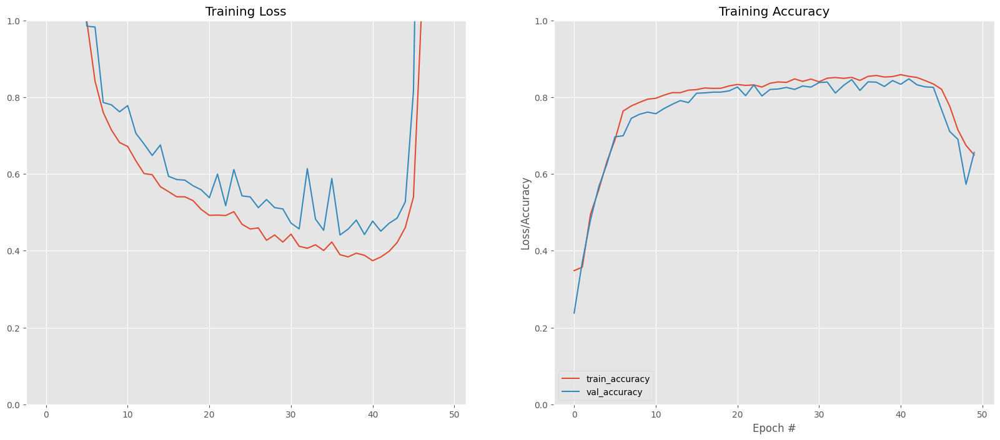

In [151]:
# Get actual number of epochs model was trained for
N = len(result_dl.history['loss'])

#Plot the model evaluation history
plt.style.use("ggplot")
fig = plt.figure(figsize=(20,8))

fig.add_subplot(1,2,1)
plt.title("Training Loss")
plt.plot(np.arange(0, N), result_dl.history["loss"], label="train_loss")
plt.plot(np.arange(0, N), result_dl.history["val_loss"], label="val_loss")
plt.ylim(0, 1)

fig.add_subplot(1,2,2)
plt.title("Training Accuracy")
plt.plot(np.arange(0, N), result_dl.history["accuracy"], label="train_accuracy")
plt.plot(np.arange(0, N), result_dl.history["val_accuracy"], label="val_accuracy")
plt.ylim(0, 1)

plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend(loc="lower left")
plt.show()

### Extract and display model frame, prediction and mask batch

In [152]:
testing_gen = TestAugmentGenerator2()
batch_img, batch_mask = next(testing_gen)
pred_all = model.predict(batch_img)
np.shape(pred_all)

# Evaluate the model on the testing data
evaluation_result = model.evaluate(testing_gen, steps=100)

# Unpack the evaluation results
test_loss, test_accuracy = evaluation_result[0], evaluation_result[1]

# Print the results
print("DeepLab Test Loss:", test_loss)
print("DeepLab Test Accuracy:", test_accuracy)

Found 11 images belonging to 1 classes.
Found 11 images belonging to 1 classes.


  1/100 [..............................] - ETA: 11s - loss: 12.6567 - dice_coef: 0.6725 - mean_io_u_13: 0.5355 - accuracy: 0.6639

100/100 [==============================] - 0s 816us/step - loss: 12.6329 - dice_coef: 0.6913 - mean_io_u_13: 0.5337 - accuracy: 0.6732
Enet Test Loss: 12.632916450500488
Enet Test Accuracy: 0.6913219690322876


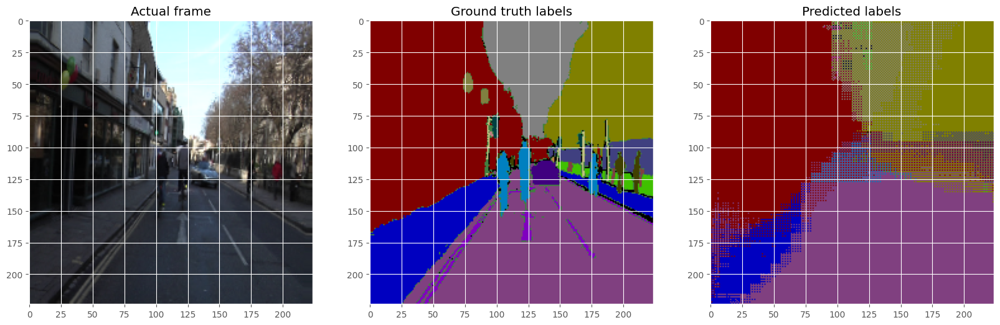

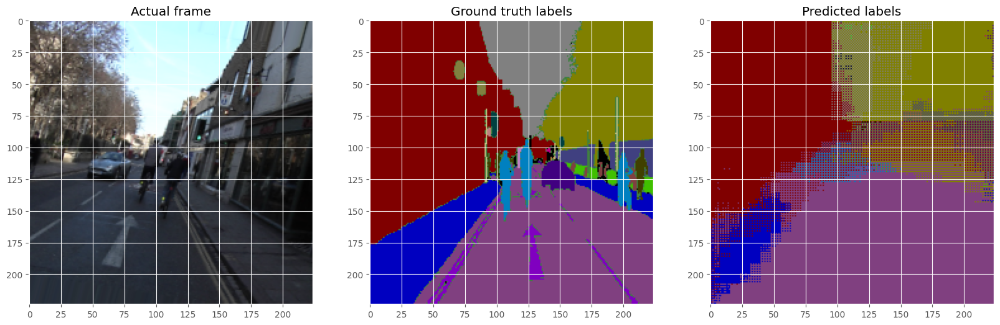

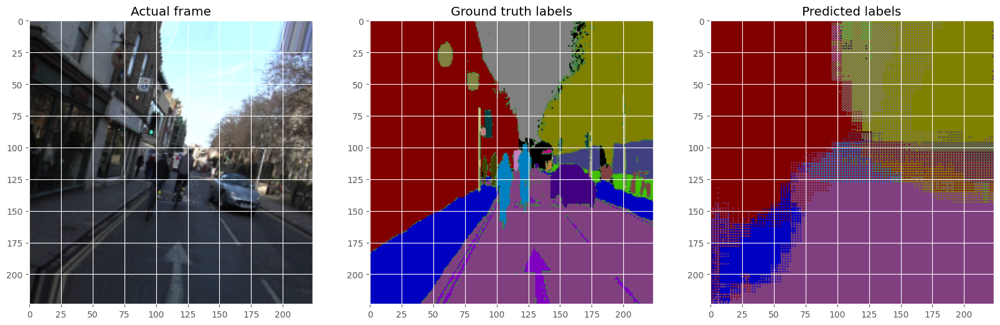

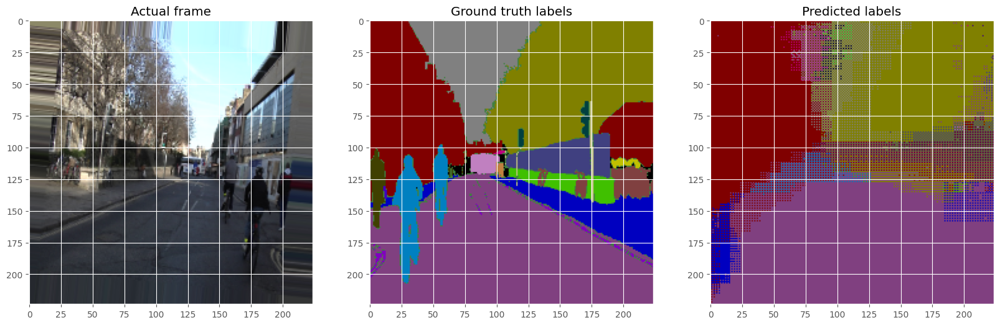

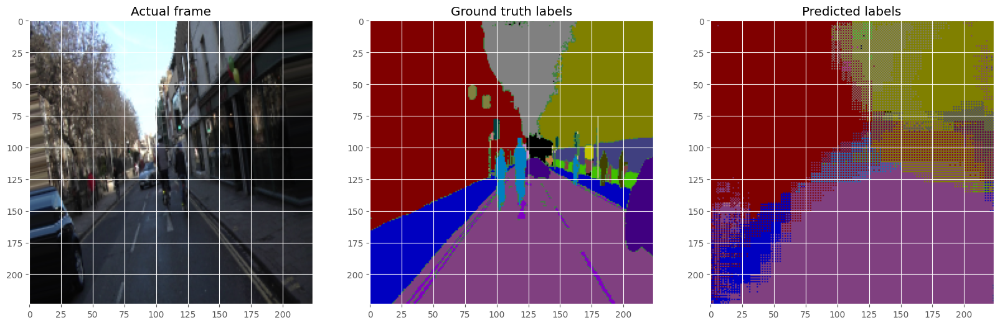

In [153]:
for i in range(0,np.shape(pred_all)[0]):
    
    fig = plt.figure(figsize=(20,8))
    
    ax1 = fig.add_subplot(1,3,1)
    ax1.imshow(batch_img[i])
    ax1.title.set_text('Actual frame')
#     ax1.grid(b=None)
    
    
    ax2 = fig.add_subplot(1,3,2)
    ax2.set_title('Ground truth labels')
    ax2.imshow(onehot_to_rgb(batch_mask[i],id2code))
#     ax2.grid(b=None)
    
    ax3 = fig.add_subplot(1,3,3)
    ax3.set_title('Predicted labels')
    ax3.imshow(onehot_to_rgb(pred_all[i],id2code))
#     ax3.grid(b=None)
    
    plt.show()

In [154]:
# Print the results
print("DeepLab Test Loss:", test_loss)
print("DeepLab Test Accuracy:", test_accuracy)

DeepLab Test Loss: 12.632916450500488
DeepLab Test Accuracy: 0.6913219690322876


# Defining UNet model for semantic segmentation

In [155]:
def unet(n_filters = 16, bn = True, dilation_rate = 1):
    '''Validation Image data generator
        Inputs: 
            n_filters - base convolution filters
            bn - flag to set batch normalization
            dilation_rate - convolution dilation rate
        Output: Unet keras Model
    '''
    #Define input batch shape
    batch_shape=(224,224,3)
    inputs = Input(batch_shape=(5, 224, 224, 3))
    print(inputs)
    
    conv1 = Conv2D(n_filters * 1, (3, 3), activation='relu', padding = 'same', dilation_rate = dilation_rate)(inputs)
    if bn:
        conv1 = BatchNormalization()(conv1)
        
    conv1 = Conv2D(n_filters * 1, (3, 3), activation='relu', padding = 'same', dilation_rate = dilation_rate)(conv1)
    if bn:
        conv1 = BatchNormalization()(conv1)
    
    pool1 = MaxPooling2D(pool_size=(2, 2), data_format='channels_last')(conv1)

    conv2 = Conv2D(n_filters * 2, (3, 3), activation='relu', padding = 'same', dilation_rate = dilation_rate)(pool1)
    if bn:
        conv2 = BatchNormalization()(conv2)
        
    conv2 = Conv2D(n_filters * 2, (3, 3), activation='relu', padding = 'same', dilation_rate = dilation_rate)(conv2)
    if bn:
        conv2 = BatchNormalization()(conv2)
    
    pool2 = MaxPooling2D(pool_size=(2, 2), data_format='channels_last')(conv2)

    conv3 = Conv2D(n_filters * 4, (3, 3), activation='relu', padding = 'same', dilation_rate = dilation_rate)(pool2)
    if bn:
        conv3 = BatchNormalization()(conv3)
        
    conv3 = Conv2D(n_filters * 4, (3, 3), activation='relu', padding = 'same', dilation_rate = dilation_rate)(conv3)
    if bn:
        conv3 = BatchNormalization()(conv3)
        
    pool3 = MaxPooling2D(pool_size=(2, 2), data_format='channels_last')(conv3)

    conv4 = Conv2D(n_filters * 8, (3, 3), activation='relu', padding = 'same', dilation_rate = dilation_rate)(pool3)
    if bn:
        conv4 = BatchNormalization()(conv4)
        
    conv4 = Conv2D(n_filters * 8, (3, 3), activation='relu', padding = 'same', dilation_rate = dilation_rate)(conv4)
    if bn:
        conv4 = BatchNormalization()(conv4)
        
    pool4 = MaxPooling2D(pool_size=(2, 2), data_format='channels_last')(conv4)

    conv5 = Conv2D(n_filters * 16, (3, 3), activation='relu', padding = 'same', dilation_rate = dilation_rate)(pool4)
    if bn:
        conv5 = BatchNormalization()(conv5)
        
    conv5 = Conv2D(n_filters * 16, (3, 3), activation='relu', padding = 'same', dilation_rate = dilation_rate)(conv5)
    if bn:
        conv5 = BatchNormalization()(conv5)
        
    up6 = concatenate([UpSampling2D(size=(2, 2))(conv5), conv4], axis=3)
    
    conv6 = Conv2D(n_filters * 8, (3, 3), activation='relu', padding = 'same', dilation_rate = dilation_rate)(up6)
    if bn:
        conv6 = BatchNormalization()(conv6)
        
    conv6 = Conv2D(n_filters * 8, (3, 3), activation='relu', padding = 'same', dilation_rate = dilation_rate)(conv6)
    if bn:
        conv6 = BatchNormalization()(conv6)
        
    up7 = concatenate([UpSampling2D(size=(2, 2))(conv6), conv3], axis=3)
    
    conv7 = Conv2D(n_filters * 4, (3, 3), activation='relu', padding = 'same', dilation_rate = dilation_rate)(up7)
    if bn:
        conv7 = BatchNormalization()(conv7)
        
    conv7 = Conv2D(n_filters * 4, (3, 3), activation='relu', padding = 'same', dilation_rate = dilation_rate)(conv7)
    if bn:
        conv7 = BatchNormalization()(conv7)
        
    up8 = concatenate([UpSampling2D(size=(2, 2))(conv7), conv2], axis=3)
    
    conv8 = Conv2D(n_filters * 2, (3, 3), activation='relu', padding = 'same', dilation_rate = dilation_rate)(up8)
    if bn:
        conv8 = BatchNormalization()(conv8)
        
    conv8 = Conv2D(n_filters * 2, (3, 3), activation='relu', padding = 'same', dilation_rate = dilation_rate)(conv8)
    if bn:
        conv8 = BatchNormalization()(conv8)
        
    up9 = concatenate([UpSampling2D(size=(2, 2))(conv8), conv1], axis=3)
    
    conv9 = Conv2D(n_filters * 1, (3, 3), activation='relu', padding = 'same', dilation_rate = dilation_rate)(up9)
    if bn:
        conv9 = BatchNormalization()(conv9)
        
    conv9 = Conv2D(n_filters * 1, (3, 3), activation='relu', padding = 'same', dilation_rate = dilation_rate)(conv9)
    if bn:
        conv9 = BatchNormalization()(conv9)
        
    conv10 = Conv2D(32, (1, 1), activation='softmax', padding = 'same', dilation_rate = dilation_rate)(conv9)

    model = Model(inputs=inputs, outputs=conv10)

    
    return model

In [156]:
model = unet(n_filters = 32)

KerasTensor(type_spec=TensorSpec(shape=(5, 224, 224, 3), dtype=tf.float32, name='input_8'), name='input_8', description="created by layer 'input_8'")


In [157]:
model.summary()

Model: "model_9"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_8 (InputLayer)           [(5, 224, 224, 3)]   0           []                               
                                                                                                  
 conv2d_33 (Conv2D)             (5, 224, 224, 32)    896         ['input_8[0][0]']                
                                                                                                  
 batch_normalization_318 (Batch  (5, 224, 224, 32)   128         ['conv2d_33[0][0]']              
 Normalization)                                                                                   
                                                                                                  
 conv2d_34 (Conv2D)             (5, 224, 224, 32)    9248        ['batch_normalization_318[0

## Train and save the UNet model

In [158]:
mc = ModelCheckpoint(mode='max', filepath='model_unet_checkpoint.h5', monitor='accuracy', save_best_only='True', save_weights_only='True', verbose=1)
es = EarlyStopping(mode='max', monitor='val_accuracy', patience=10, verbose=1)
callbacks = [mc, es]

In [159]:
class TimingCallback(tf.keras.callbacks.Callback):
    def on_train_begin(self, logs={}):
        self.train_times = []
        
    def on_epoch_begin(self, epoch, logs={}):
        self.start_time = time.time()
        
    def on_epoch_end(self, epoch, logs={}):
        epoch_time = time.time() - self.start_time
        self.train_times.append(epoch_time)
        logs['time'] = epoch_time

In [160]:
best_model = None
best_score = 0

lr = 0.001
optimizer = Adam(learning_rate=lr)
metrics = [MeanIoU(32),dice_coef,'accuracy']
loss_functions = ["categorical_crossentropy", dice_coef_loss2]

for loss_function in loss_functions:    
    model.compile(optimizer=optimizer, loss=loss_function, metrics=[dice_coef, MeanIoU(32), 'accuracy'])
    # Create an instance of the TimingCallback class
    timing_callback = TimingCallback()

    # Train the model with the timing callback
    unet_result = model.fit(TrainAugmentGenerator(), steps_per_epoch=steps_per_epoch,
                          validation_data=ValAugmentGenerator(),
                          validation_steps=validation_steps, epochs=num_epochs,
                          callbacks=[callbacks, timing_callback], use_multiprocessing=False, verbose=2)

    # Get the training time for each epoch from the train_times attribute of the timing_callback object
    training_time = np.sum(timing_callback.train_times)

    # Print the total training time
    print("Total training time: {} seconds".format(training_time))

    score = model.evaluate(x=ValAugmentGenerator(), steps=100, verbose=1)
    print(score)
    # Making pixel-wise accuracy as the main deciding metric
    if score[3] > best_score:
      best_model = model
      best_score = score[3]
      best_hyperparameters = {
                      'learning_rate': lr,
                      'optimizer': optimizer,
                      'loss_function': str(loss_function),
                      'total_time': training_time
                  }
      
      model.save_weights("model_unet.h5", overwrite=True)

print("Best hyperparameters:", best_hyperparameters)
print("Total time:", {training_time})

Found 81 images belonging to 1 classes.
Found 81 images belonging to 1 classes.
Epoch 1/50
Found 9 images belonging to 1 classes.
Found 9 images belonging to 1 classes.

Epoch 00001: accuracy improved from -inf to 0.49798, saving model to model_unet_checkpoint.h5
15/15 - 20s - loss: 2.2330 - dice_coef: 0.3629 - mean_io_u_15: 0.4848 - accuracy: 0.4980 - val_loss: 4.7676 - val_dice_coef: 0.0620 - val_mean_io_u_15: 0.4848 - val_accuracy: 0.0872 - time: 20.3249 - 20s/epoch - 1s/step
Epoch 2/50

Epoch 00002: accuracy improved from 0.49798 to 0.66023, saving model to model_unet_checkpoint.h5
15/15 - 7s - loss: 1.4779 - dice_coef: 0.5977 - mean_io_u_15: 0.4848 - accuracy: 0.6602 - val_loss: 18.7482 - val_dice_coef: 0.0934 - val_mean_io_u_15: 0.4996 - val_accuracy: 0.0894 - time: 7.3495 - 7s/epoch - 490ms/step
Epoch 3/50

Epoch 00003: accuracy improved from 0.66023 to 0.68546, saving model to model_unet_checkpoint.h5
15/15 - 7s - loss: 1.2419 - dice_coef: 0.6704 - mean_io_u_15: 0.4848 - accura

# UNet Model Evaluation

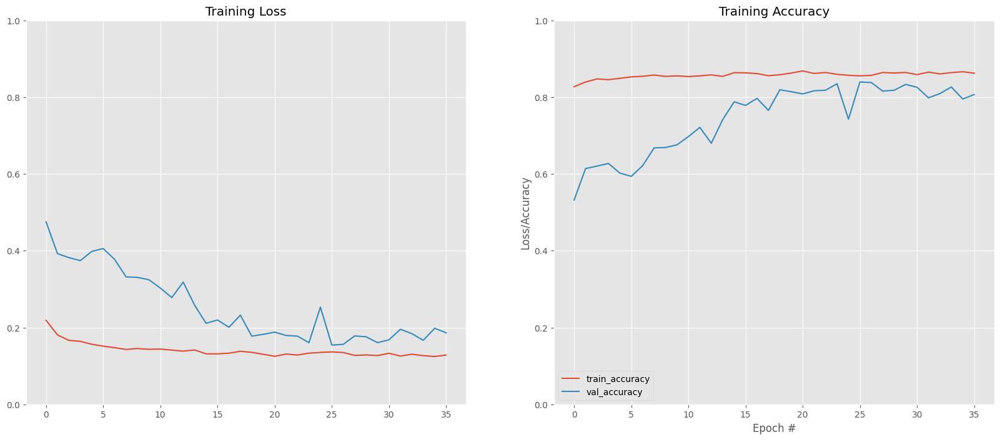

In [161]:
# Get actual number of epochs model was trained for
N = len(unet_result.history['loss'])

#Plot the model evaluation history
plt.style.use("ggplot")
fig = plt.figure(figsize=(20,8))

fig.add_subplot(1,2,1)
plt.title("Training Loss")
plt.plot(np.arange(0, N), unet_result.history["loss"], label="train_loss")
plt.plot(np.arange(0, N), unet_result.history["val_loss"], label="val_loss")
plt.ylim(0, 1)

fig.add_subplot(1,2,2)
plt.title("Training Accuracy")
plt.plot(np.arange(0, N), unet_result.history["accuracy"], label="train_accuracy")
plt.plot(np.arange(0, N), unet_result.history["val_accuracy"], label="val_accuracy")
plt.ylim(0, 1)

plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend(loc="lower left")
plt.show()

### Extract and display model frame, prediction and mask batch

In [162]:
testing_gen = TestAugmentGenerator2()
batch_img, batch_mask = next(testing_gen)
pred_all = model.predict(batch_img)
np.shape(pred_all)

# Evaluate the model on the testing data
evaluation_result = model.evaluate(testing_gen, steps=100)

# Unpack the evaluation results
test_loss, test_accuracy = evaluation_result[0], evaluation_result[1]

# Print the results
print("UNet Test Loss:", test_loss)
print("UNet Test Accuracy:", test_accuracy)

Found 11 images belonging to 1 classes.
Found 11 images belonging to 1 classes.


  1/100 [..............................] - ETA: 12s - loss: 0.1790 - dice_coef: 0.8310 - mean_io_u_16: 0.4848 - accuracy: 0.8122

100/100 [==============================] - 0s 579us/step - loss: 0.1691 - dice_coef: 0.8600 - mean_io_u_16: 0.4848 - accuracy: 0.8223
UNet Test Loss: 0.16910266876220703
UNet Test Accuracy: 0.8599541187286377


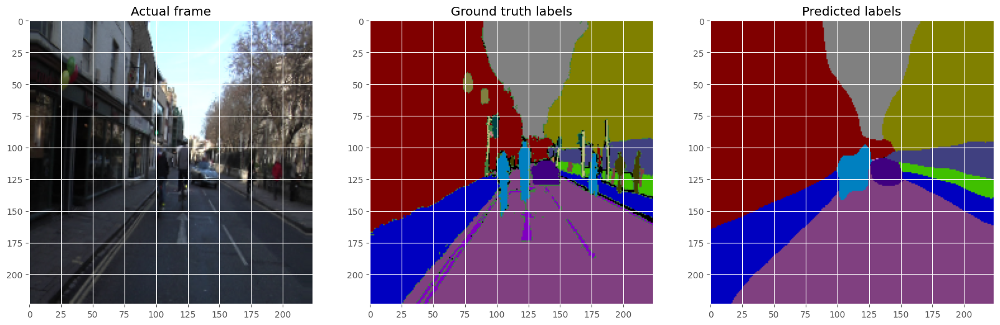

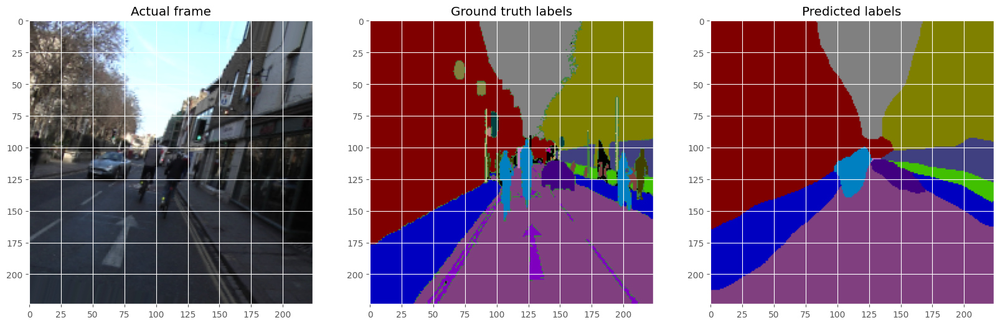

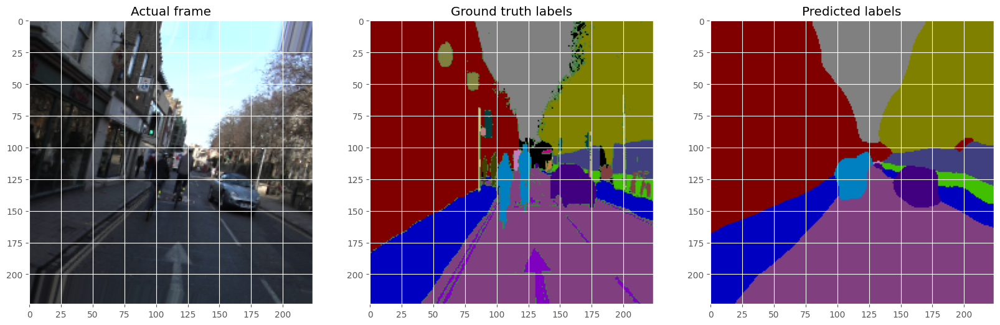

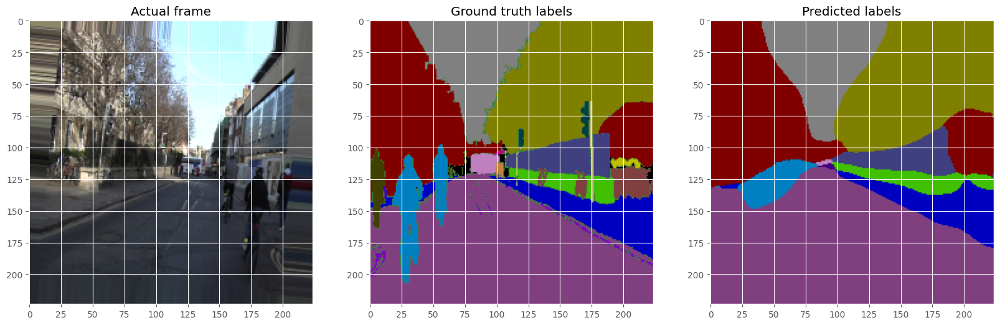

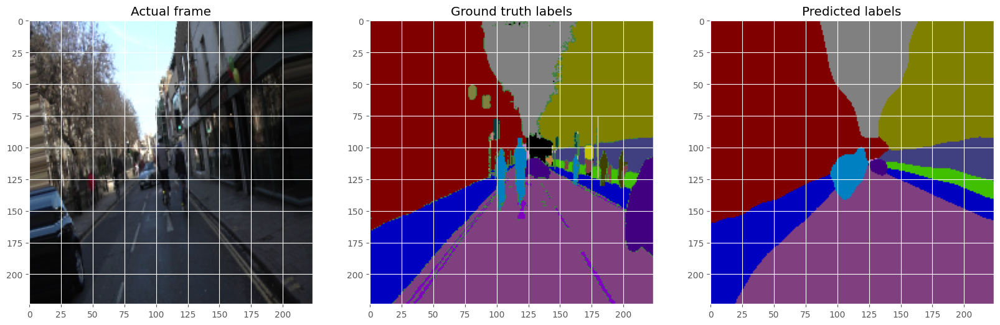

In [163]:
for i in range(0,np.shape(pred_all)[0]):
    
    fig = plt.figure(figsize=(20,8))
    
    ax1 = fig.add_subplot(1,3,1)
    ax1.imshow(batch_img[i])
    ax1.title.set_text('Actual frame')
#     ax1.grid(b=None)
    
    
    ax2 = fig.add_subplot(1,3,2)
    ax2.set_title('Ground truth labels')
    ax2.imshow(onehot_to_rgb(batch_mask[i],id2code))
#     ax2.grid(b=None)
    
    ax3 = fig.add_subplot(1,3,3)
    ax3.set_title('Predicted labels')
    ax3.imshow(onehot_to_rgb(pred_all[i],id2code))
#     ax3.grid(b=None)
    
    plt.show()

In [164]:
print("UNet Test Loss:", test_loss)
print("UNet Test Accuracy:", test_accuracy)

UNet Test Loss: 0.16910266876220703
UNet Test Accuracy: 0.8599541187286377
